# FD-DeepLoc inference example
The inference process includes the following steps:
1. Set the path for the trained network model and experimental images.
2. Set necessary parameters.
3. Load the network and plot the training process.
4. Check a specific experiment frame and corresponding network's multi-channel predictions.
5. Start inferring.
6. Load the ground-truth and assess(optional). 

In [1]:
import pickle
import sys
import seaborn as sns

sns.set_style("white")
sys.setrecursionlimit(10000)
%matplotlib notebook

from fd_deeploc_core import *
from local_utils import *

## 1. Set the path for the trained network model and experimental images.
The printed `save_path` is where to save the network's predicted molecule list.

In [2]:
# set the trained model path and the image path that need to be analysed
network_path = "./demo_datasets/demo3_FD_dmo3tetrapod_neuron/demo3_FD-DeepLoc.pkl"
image_path = "./demo_datasets/demo3_FD_dmo3tetrapod_neuron/wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default.ome.tif"
save_path = './'+os.path.split(network_path)[-1].split('.')[0]+'_'+os.path.split(image_path)[-1].split('.')[0]+'.csv'
print(save_path)

./demo3_FD-DeepLoc_wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default.csv


## 2. Set necessary parameters.
* `stack_giga` is the size of sequentially processed images (in gigabyte), it is only an approximate value, set it small when you have limited RAM.
* `pixel_size` is the physical size of each camera pixel (_xy_ in nm).
* `start_field_pos`: **Important**, it is the **_xy_** position of the upper left pixel of the input images in the entire FOV. For example, `start_field_pos` [102,41] means the upper left pixel (namely local position [0,0]) of the input images is located at [102,41] of the whole FOV. Thus CoordConv can get the global position of the input images.

In [3]:
# set the size of file to be processed sequentially, unit: gigabyte
stack_giga = 0.5
pixel_size = [110, 110]
start_field_pos = [0, 0]

## 3. Load the network and plot the training process.

<IPython.core.display.Javascript object>


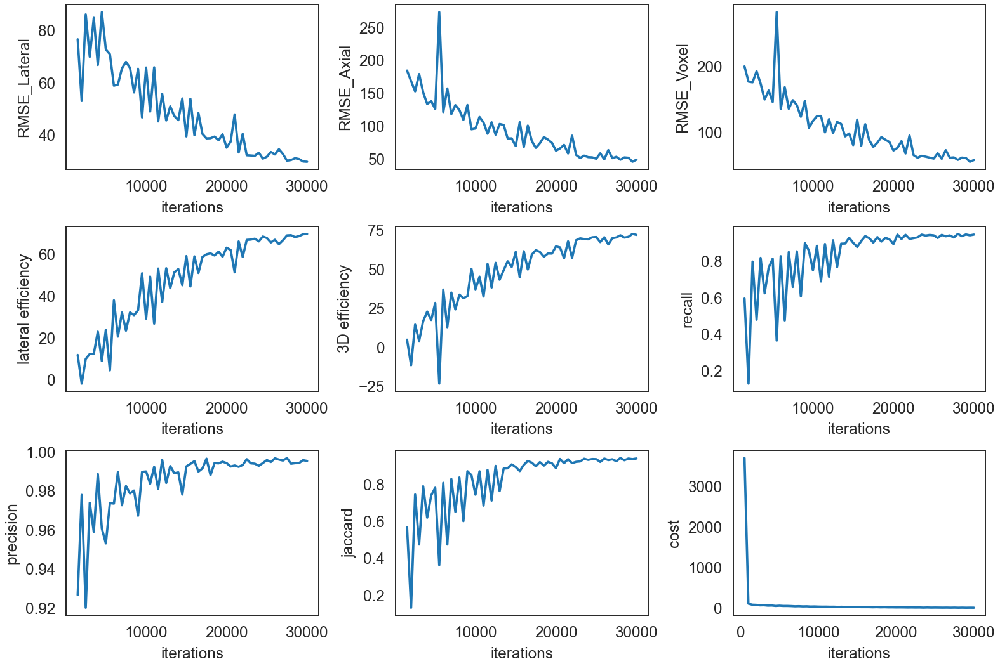

In [4]:
# load the completely trained FD_DECODE model
with open(network_path, 'rb') as f:
    model = pickle.load(f)

# plot performance during the training
plot_train_record(model)

## 4. Check a specific experiment frame and corresponding network's multi-channel predictions.
* `plot_num`: The number of specific image that will be checked, better $\geq$ 5 (considering temporal context and background estimation)
* `nms`: If False, only use a simple threshold `nms_thre` to filter probability channel to get the deterministic pixels. If True, probability channel pixels with value>`candi_thre` will be treated as candidates for local maximum searching. Then add the values from the 4 adjacent pixels to local maximums and filter the modified probability channel with the threshold `nms_thre` to get deterministic pixel-level localizations.
* `rescale_xy`: Rescales _x_ and _y_ offsets (inplace) so that they are distributed uniformly within [-0.5, 0.5] to correct for biased outputs (usually False).
* `pixel_size`,`start_field_pos` are explained before.
* `divide_and_conquer`: Divide the large images into small sub-area images. This is necessary as large input images may lead to GPU memory problem, this enables the network process the large images by sub-areas.
* `win_size`: If `divide_and_conquer`=True, set the size of sub-areas to be analyzed, must be a multiple of 4 (avoid error when down-sampling or up-sampling).
* `padding`: If `divide_and_conquer`=True and `padding`=True, this will segment a larger area (20 pixels) than `win_size` and traverse with overlap to avoid error from incomplete PSFs at margin.

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_23.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_23.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_23.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_23.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_23.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_23.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_23.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_23.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_23.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_23.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_23.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_23.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_23.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_23.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_23.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_23.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_23.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_23.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_23.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_23.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_23.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_30.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_38.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_38.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_38.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_38.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_38.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_38.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_38.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_45.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_60.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_75.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_75.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_75.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_75.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_75.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_75.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_75.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_75.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_75.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_75.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_75.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_75.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_75.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_75.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_82.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_90.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_105.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_105.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_105.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_105.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_105.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_105.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_105.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


<IPython.core.display.Javascript object>


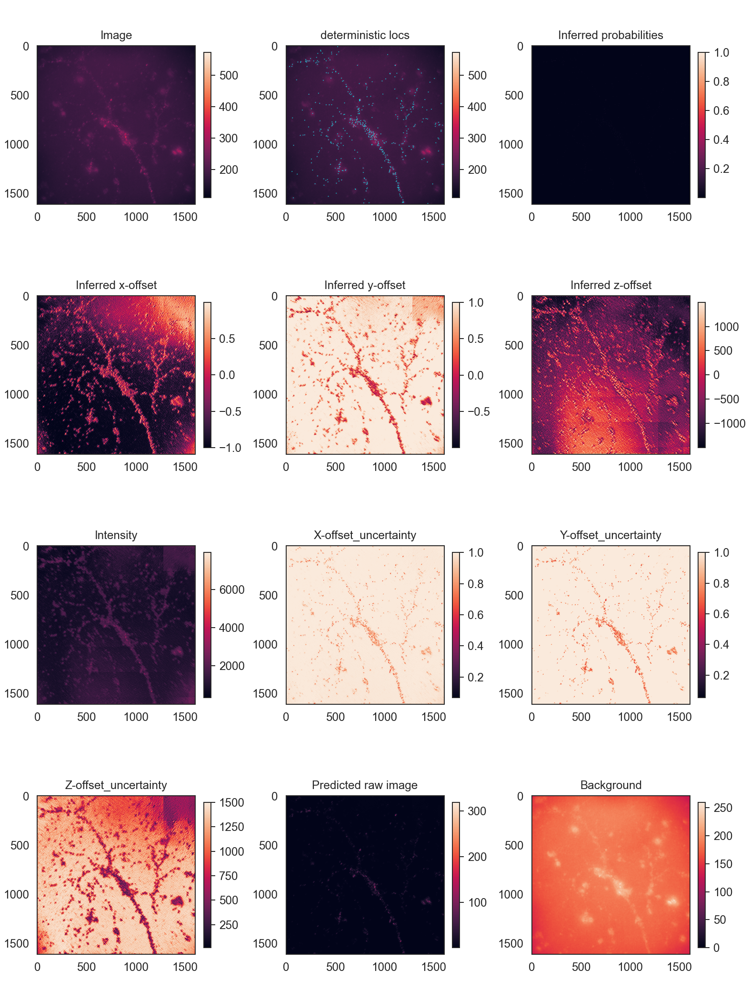

<IPython.core.display.Javascript object>


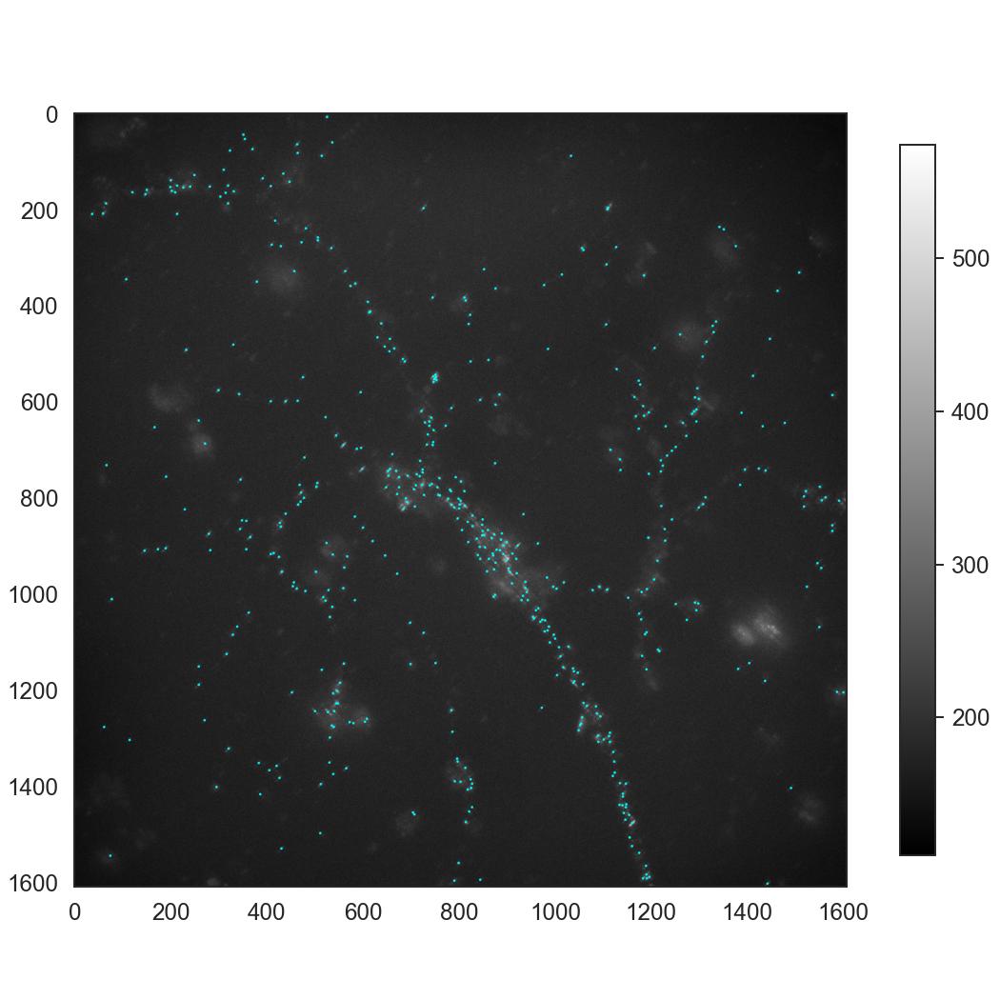

In [5]:
# check the specified frame and corresponding multi-channel output
check_specific_frame_output(plot_num=5, model=model, image_path=image_path, eval_csv=None,
                            nms=True, candi_thre=0.3, nms_thre=0.3, rescale_xy=False, pixel_size=pixel_size,
                            start_field_pos=start_field_pos, divide_and_conquer=True, win_size=256, padding=True)

## 5. Start inferring.
Read big tiff and predict, save the predictions every finish processing `stack_giga`-sized SMLM images, even some accidents happen you will not lose all results. If there is already a prediction file with the same name as `save_path`, inference will start from the last saved frame number in the `save_path` file. We recommend using SMAP to postprocess the prediction list (drift correction, grouping, etc.) and render the super-resolution image (Ries, J. SMAP: a modular super-resolution microscopy analysis platform for SMLM data. Nat Methods 17, 870–872 (2020). https://doi.org/10.1038/s41592-020-0938-1). 
* The parameters haven been explained before.

In [6]:
# read big tiff and predict, save the predictions every finish processing stack_giga-sized SMLM images,
# even some accidents happen you will not lose all results
total_shape,fov_size = read_bigtiff_and_predict(model, image_path, stack_giga=stack_giga, batch_size=10,
                                                use_tqdm=True, nms=True, candi_thre=0.3, nms_thre=0.3,
                                                rescale_xy=False, pixel_size=pixel_size, start_field_pos=start_field_pos, 
                                                divide_and_conquer=True, win_size=256, padding=True, save_path=save_path)

the file to save the predictions is:  ./demo3_FD-DeepLoc_wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default.csv


OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_12.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_13.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_14.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_15.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_19.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_20.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_21.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_22.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_26.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_27.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_28.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_29.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_33.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_33.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_33.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_33.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_33.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_33.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_33.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_33.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_33.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_33.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_33.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_33.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_33.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_33.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_33.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_33.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_33.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_33.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_33.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_33.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_33.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_33.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_33.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_33.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_33.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_34.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_35.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_36.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_37.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_41.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_42.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_43.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_44.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_48.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_49.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_50.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_51.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_52.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_56.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_57.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_58.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_59.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_63.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_64.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_65.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_66.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_67.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_70.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_70.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_70.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_70.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_70.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_70.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_70.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_71.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_72.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_73.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_74.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_78.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_79.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_80.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_81.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_85.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_85.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_85.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_85.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_85.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_85.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_85.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_85.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_85.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_85.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_85.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_85.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_85.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_85.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_85.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_85.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_85.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_86.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_87.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_88.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_89.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_93.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_94.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_95.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_96.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_97.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Defa

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_101.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_102.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_103.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_104.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_108.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_109.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_110.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_111.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_112.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_116.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_117.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_118.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta

OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMStack_Default_119.ome.tif'
OME series: failed to read 'wide_field_Spectrin_Neuron_Day24_tetrapod_objective_15ms_1800mw_1608_1_MMSta


processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.26it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.11it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.18it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.17it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.14it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.20it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.64it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.29it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.42it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.49it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.57it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.53it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.43it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.23it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.51it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.50it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.58it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.58it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.54it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.02it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.26it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.57it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.56it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.50it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.42it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.46it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.95it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.10it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.44it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.51it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.53it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.47it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.51it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.02it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.19it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.48it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.37it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.43it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.45it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.45it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.10it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 31.07it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.26it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.57it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.41it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.41it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.41it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 53.28it/s]



stack: 2/971, contain imgs: 103, already analyzed:103/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.00it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.12it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.15it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.13it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.09it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.64it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.14it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.44it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.41it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.34it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.32it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.47it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.02it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.44it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.37it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.38it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.37it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.45it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.10it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.32it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.35it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.42it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.95it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.01it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.34it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.39it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.37it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.38it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.95it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.02it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.39it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.33it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 31.16it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.10it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.49it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.57it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.26it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.41it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 76.07it/s]

stack: 3/971, contain imgs: 103, already analyzed:206/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.82it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.98it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.08it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.98it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.98it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.12it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.98it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.92it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.35it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.35it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.35it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.35it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.32it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.95it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.10it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.36it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.36it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.97it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.41it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.36it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.34it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.00it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.35it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.33it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.94it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.35it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.36it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.33it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.34it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.35it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.89it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.33it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.95it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.33it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.02it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 74.52it/s]



stack: 4/971, contain imgs: 103, already analyzed:309/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.21it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.90it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.95it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.96it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.47it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.03it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.37it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.43it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.33it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.95it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.37it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.35it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.41it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.90it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.35it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.36it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.34it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.33it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.95it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.35it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 31.07it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.10it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.95it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.10it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.18it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 74.52it/s]

stack: 5/971, contain imgs: 103, already analyzed:412/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.07it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.95it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.96it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.05it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.93it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.47it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.95it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.32it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.97it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.32it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.95it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.93it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.32it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.08it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.34it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.02it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.22it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.02it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.10it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.95it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.95it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.03it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 76.07it/s]

stack: 6/971, contain imgs: 103, already analyzed:515/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.83it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.99it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.91it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.94it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 31.07it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.33it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.32it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.95it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.32it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.98it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.32it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.32it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.64it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.02it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.18it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 75.54it/s]



stack: 7/971, contain imgs: 103, already analyzed:618/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.73it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.76it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.93it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.89it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.00it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.34it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.04it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.32it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.36it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.55it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 73.54it/s]



stack: 8/971, contain imgs: 103, already analyzed:721/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.12it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.90it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.96it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.95it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.95it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.95it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.47it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.96it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.32it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.90it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.35it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.36it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.91it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.30it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 73.04it/s]



stack: 9/971, contain imgs: 103, already analyzed:824/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.82it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.02it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.91it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.92it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.05it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.34it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.55it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.26it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 72.56it/s]



stack: 10/971, contain imgs: 103, already analyzed:927/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.34it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.96it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.98it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 31.33it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.32it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.37it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.38it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.95it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.02it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 70.70it/s]



stack: 11/971, contain imgs: 103, already analyzed:1030/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.38it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.91it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.90it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.22it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.96it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.66it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.33it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.35it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.89it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 71.62it/s]



stack: 12/971, contain imgs: 103, already analyzed:1133/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.21it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.98it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.81it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.34it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.73it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.96it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.08it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.89it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.26it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.88it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 69.80it/s]



stack: 13/971, contain imgs: 103, already analyzed:1236/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.93it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.92it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.91it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.64it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.94it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.81it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.33it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.96it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.07it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.55it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.95it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.03it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 69.81it/s]



stack: 14/971, contain imgs: 103, already analyzed:1339/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.16it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.96it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.72it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.32it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.32it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.32it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.00it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.71it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.74it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.00it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.38it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 74.02it/s]



stack: 15/971, contain imgs: 103, already analyzed:1442/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.49it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.98it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.93it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.06it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.90it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.07it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.38it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.88it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.03it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 73.55it/s]



stack: 16/971, contain imgs: 103, already analyzed:1545/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.60it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.95it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.68it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.81it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.07it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.30it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 69.81it/s]



stack: 17/971, contain imgs: 103, already analyzed:1648/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.82it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.96it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.69it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.47it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.97it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.33it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.99it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.05it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.64it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.95it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 76.07it/s]

stack: 18/971, contain imgs: 103, already analyzed:1751/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.13it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.97it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.97it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.30it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.72it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.72it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 75.03it/s]



stack: 19/971, contain imgs: 103, already analyzed:1854/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.17it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.30it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.06it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.55it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.02it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.07it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.18it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 68.93it/s]



stack: 20/971, contain imgs: 103, already analyzed:1957/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.48it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.76it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00, 10.04it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.93it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.74it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.47it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.00it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.30it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.02it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 71.16it/s]



stack: 21/971, contain imgs: 103, already analyzed:2060/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.81it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.95it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.97it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.38it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.95it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.95it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 71.61it/s]



stack: 22/971, contain imgs: 103, already analyzed:2163/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.16it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.92it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.75it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.97it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.93it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.76it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.47it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.95it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.95it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 70.70it/s]



stack: 23/971, contain imgs: 103, already analyzed:2266/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.93it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.95it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.91it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.81it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.96it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.07it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.32it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.98it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 70.70it/s]



stack: 24/971, contain imgs: 103, already analyzed:2369/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.12it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.75it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.93it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.91it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.22it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.94it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.32it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.74it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.89it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.02it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 70.70it/s]



stack: 25/971, contain imgs: 103, already analyzed:2472/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.26it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.93it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.94it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.47it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.55it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 74.02it/s]



stack: 26/971, contain imgs: 103, already analyzed:2575/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.38it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.30it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.33it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.07it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.74it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.03it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.76it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.96it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.05it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.05it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.95it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 68.93it/s]



stack: 27/971, contain imgs: 103, already analyzed:2678/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.81it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.93it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.64it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.76it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.34it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.78it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.90it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.78it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.22it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 74.02it/s]



stack: 28/971, contain imgs: 103, already analyzed:2781/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.79it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.90it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.98it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.90it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.22it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.70it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.05it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.95it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 75.54it/s]



stack: 29/971, contain imgs: 103, already analyzed:2884/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.54it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.93it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.96it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.33it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.90it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.00it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.55it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 71.62it/s]



stack: 30/971, contain imgs: 103, already analyzed:2987/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.11it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.90it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.92it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.97it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.89it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.75it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.22it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.02it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 75.54it/s]



stack: 31/971, contain imgs: 103, already analyzed:3090/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.16it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.74it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.94it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.05it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.90it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.07it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.13it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 73.53it/s]



stack: 32/971, contain imgs: 103, already analyzed:3193/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.74it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.95it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.90it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.14it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.35it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.69it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.07it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.22it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.02it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 76.07it/s]

stack: 33/971, contain imgs: 103, already analyzed:3296/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.53it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.05it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.57it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.92it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.22it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.64it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 69.81it/s]



stack: 34/971, contain imgs: 103, already analyzed:3399/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.75it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.73it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.91it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.22it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.73it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.76it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.75it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.64it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 61.27it/s]



stack: 35/971, contain imgs: 103, already analyzed:3502/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.14it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.69it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.38it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.93it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.08it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.78it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.76it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.98it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.02it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 71.17it/s]



stack: 36/971, contain imgs: 103, already analyzed:3605/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.16it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.39it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.76it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.92it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.30it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 71.16it/s]



stack: 37/971, contain imgs: 103, already analyzed:3708/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.48it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.91it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.94it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.74it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.13it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.08it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.32it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.91it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.22it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 68.08it/s]



stack: 38/971, contain imgs: 103, already analyzed:3811/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  7.93it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.97it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.97it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.91it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.65it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.93it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.07it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.05it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 70.70it/s]



stack: 39/971, contain imgs: 103, already analyzed:3914/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.68it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.90it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.81it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.95it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.73it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.08it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.22it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 61.98it/s]



stack: 40/971, contain imgs: 103, already analyzed:4017/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.50it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.91it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.13it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.91it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.94it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.22it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 74.53it/s]



stack: 41/971, contain imgs: 103, already analyzed:4120/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.07it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.91it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.30it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.93it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.03it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.75it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.08it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.64it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.70it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.55it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 70.70it/s]



stack: 42/971, contain imgs: 103, already analyzed:4223/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.00it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.90it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.97it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.93it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.64it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.95it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.32it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.75it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.03it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.06it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.78it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.30it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.78it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 69.37it/s]



stack: 43/971, contain imgs: 103, already analyzed:4326/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.53it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.69it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.97it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.32it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.05it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.30it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 70.70it/s]



stack: 44/971, contain imgs: 103, already analyzed:4429/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.27it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.90it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.30it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.01it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.22it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 73.04it/s]



stack: 45/971, contain imgs: 103, already analyzed:4532/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.79it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.13it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.91it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.78it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.47it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.73it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 72.56it/s]



stack: 46/971, contain imgs: 103, already analyzed:4635/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.45it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.73it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.74it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.30it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.95it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.30it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.18it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 72.09it/s]



stack: 47/971, contain imgs: 103, already analyzed:4738/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.38it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.05it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.62it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.55it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 60.95it/s]



stack: 48/971, contain imgs: 103, already analyzed:4841/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.46it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.93it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.96it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.92it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.38it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.03it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.22it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.50it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 73.04it/s]



stack: 49/971, contain imgs: 103, already analyzed:4944/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.04it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.74it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.97it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.76it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.97it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.90it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.07it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.13it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.95it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 75.54it/s]

stack: 50/971, contain imgs: 103, already analyzed:5047/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.95it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.97it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.30it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 75.54it/s]



stack: 51/971, contain imgs: 103, already analyzed:5150/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.03it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.94it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.95it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.92it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.74it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.89it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.92it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.74it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.74it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.08it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.30it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 72.56it/s]



stack: 52/971, contain imgs: 103, already analyzed:5253/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.06it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.96it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.96it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.05it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.32it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.73it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 69.37it/s]



stack: 53/971, contain imgs: 103, already analyzed:5356/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.79it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.91it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.90it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.89it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.03it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.08it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.75it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.07it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.47it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 68.08it/s]



stack: 54/971, contain imgs: 103, already analyzed:5459/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.14it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.73it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.92it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.97it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.90it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.34it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.78it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.73it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.75it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.55it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.58it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.78it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 74.02it/s]

stack: 55/971, contain imgs: 103, already analyzed:5562/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.06it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.91it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.47it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.33it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.90it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.03it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.47it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 73.04it/s]



stack: 56/971, contain imgs: 103, already analyzed:5665/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.92it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.92it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.92it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.97it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.70it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.07it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.38it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 72.56it/s]



stack: 57/971, contain imgs: 103, already analyzed:5768/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.12it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.13it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.75it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.73it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.75it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 26.90it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.76it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.06it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.13it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 72.56it/s]



stack: 58/971, contain imgs: 103, already analyzed:5871/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.60it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.73it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.97it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.93it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.07it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.78it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.73it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.78it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.89it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 68.51it/s]



stack: 59/971, contain imgs: 103, already analyzed:5974/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.96it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.93it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.30it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.98it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.08it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.34it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.32it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.38it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 76.07it/s]



stack: 60/971, contain imgs: 103, already analyzed:6077/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.45it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.70it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.90it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.89it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.07it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.97it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.78it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.06it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.89it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.88it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.64it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 75.54it/s]



stack: 61/971, contain imgs: 103, already analyzed:6180/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.56it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.93it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.92it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.76it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.71it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.65it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.67it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.71it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.64it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.05it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 72.56it/s]



stack: 62/971, contain imgs: 103, already analyzed:6283/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.05it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.75it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.81it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.03it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.76it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.07it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.97it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.10it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 72.56it/s]



stack: 63/971, contain imgs: 103, already analyzed:6386/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.48it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.89it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.44it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.72it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.00it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.05it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.64it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.10it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.71it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 73.53it/s]



stack: 64/971, contain imgs: 103, already analyzed:6489/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.08it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.69it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.92it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.22it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.73it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.44it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.95it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.71it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.71it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.71it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.64it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.44it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 64.50it/s]



stack: 65/971, contain imgs: 103, already analyzed:6592/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  7.93it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.65it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.52it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.61it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.60it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.55it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.10it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.45it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.96it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.01it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.96it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.02it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.00it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.51it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.63it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.08it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.71it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.23it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.22it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 68.95it/s]



stack: 66/971, contain imgs: 103, already analyzed:6695/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.54it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.74it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.95it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.96it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.57it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.06it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.75it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.78it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.75it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.73it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.68it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.55it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.95it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 67.25it/s]



stack: 67/971, contain imgs: 103, already analyzed:6798/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.06it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.13it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.73it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.71it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.08it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.71it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.22it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 72.56it/s]



stack: 68/971, contain imgs: 103, already analyzed:6901/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.43it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.76it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.76it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.97it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.06it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.71it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.06it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.76it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.71it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.47it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 73.04it/s]



stack: 69/971, contain imgs: 103, already analyzed:7004/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.08it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.91it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.90it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.22it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.36it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.91it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.08it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.73it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.08it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.07it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.37it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.71it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.05it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 72.09it/s]



stack: 70/971, contain imgs: 103, already analyzed:7107/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.95it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.94it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.14it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.91it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.34it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.32it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.97it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.78it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.50it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.71it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.22it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.36it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 68.93it/s]



stack: 71/971, contain imgs: 103, already analyzed:7210/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.64it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.96it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.74it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.62it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.38it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.33it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.78it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.70it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.89it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 74.02it/s]



stack: 72/971, contain imgs: 103, already analyzed:7313/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.58it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.38it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.91it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.06it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.73it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.22it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 69.81it/s]



stack: 73/971, contain imgs: 103, already analyzed:7416/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.29it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.13it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.34it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.72it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.14it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 73.04it/s]



stack: 74/971, contain imgs: 103, already analyzed:7519/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.07it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.93it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.73it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.95it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.89it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.67it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.32it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.32it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.22it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.50it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 72.56it/s]



stack: 75/971, contain imgs: 103, already analyzed:7622/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.43it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.71it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.48it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.35it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.43it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.52it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.65it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.17it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.76it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.97it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 61.27it/s]



stack: 76/971, contain imgs: 103, already analyzed:7725/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.36it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.92it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.91it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.91it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.13it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.73it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.72it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.97it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 69.82it/s]



stack: 77/971, contain imgs: 103, already analyzed:7828/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.86it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.91it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.75it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.22it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.06it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.62it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.74it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.73it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.14it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 70.70it/s]



stack: 78/971, contain imgs: 103, already analyzed:7931/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.49it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.95it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.14it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.78it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.05it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.93it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.93it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.81it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.36it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.72it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 72.56it/s]



stack: 79/971, contain imgs: 103, already analyzed:8034/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.04it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.94it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.93it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.49it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.72it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.73it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 72.56it/s]



stack: 80/971, contain imgs: 103, already analyzed:8137/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.58it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.90it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.57it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.97it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.75it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.07it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.78it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.70it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.71it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.76it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.56it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 72.09it/s]



stack: 81/971, contain imgs: 103, already analyzed:8240/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.91it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.30it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.32it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.06it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.71it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.07it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.01it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.57it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.72it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.18it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 75.03it/s]



stack: 82/971, contain imgs: 103, already analyzed:8343/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.54it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.22it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.93it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.72it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.05it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 70.25it/s]



stack: 83/971, contain imgs: 103, already analyzed:8446/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.06it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.72it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.22it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.64it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.78it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.08it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.78it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.30it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 69.81it/s]



stack: 84/971, contain imgs: 103, already analyzed:8549/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.06it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.97it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.91it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.93it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.73it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.89it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.78it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.70it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.06it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.08it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.03it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.03it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.97it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.80it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 71.62it/s]



stack: 85/971, contain imgs: 103, already analyzed:8652/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.80it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.74it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.05it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.76it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.93it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.30it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.72it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.06it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.78it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.97it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 76.07it/s]



stack: 86/971, contain imgs: 103, already analyzed:8755/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.19it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.93it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.74it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.73it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.29it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.74it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.38it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 75.54it/s]

stack: 87/971, contain imgs: 103, already analyzed:8858/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.61it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.75it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.97it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.02it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.95it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.73it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.14it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.87it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 72.56it/s]



stack: 88/971, contain imgs: 103, already analyzed:8961/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.43it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.97it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.91it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.93it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.13it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.27it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.30it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.50it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.74it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.05it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 68.08it/s]



stack: 89/971, contain imgs: 103, already analyzed:9064/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.62it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.96it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.96it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.71it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.71it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.05it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.75it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.65it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.76it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.97it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 69.81it/s]



stack: 90/971, contain imgs: 103, already analyzed:9167/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.70it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.96it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.88it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.72it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.47it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.28it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.71it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.08it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.05it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 73.04it/s]



stack: 91/971, contain imgs: 103, already analyzed:9270/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.16it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.91it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.05it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.08it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.78it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.75it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.72it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.89it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.36it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.50it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 71.62it/s]



stack: 92/971, contain imgs: 103, already analyzed:9373/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.73it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.96it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.89it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.08it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.78it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.67it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.97it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 71.16it/s]



stack: 93/971, contain imgs: 103, already analyzed:9476/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.37it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.81it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.75it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.83it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.94it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.97it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.75it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.26it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.31it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.92it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 26.90it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.74it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.04it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.57it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.76it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.08it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.90it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.97it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.78it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.65it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 75.03it/s]



stack: 94/971, contain imgs: 103, already analyzed:9579/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.02it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.76it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.95it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.65it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.87it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.95it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.93it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.77it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.76it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.10it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.64it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.05it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.57it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 76.07it/s]



stack: 95/971, contain imgs: 103, already analyzed:9682/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.05it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.62it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.73it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.73it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.81it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.66it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.57it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.70it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.57it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.75it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.07it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.71it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.95it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.06it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.04it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 26.97it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.60it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.96it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.87it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.97it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.06it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.03it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.64it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.41it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.24it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.60it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 62.67it/s]



stack: 96/971, contain imgs: 103, already analyzed:9785/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.24it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.72it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.72it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.72it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.73it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.78it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.73it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.73it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.23it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.05it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.73it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.64it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.59it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.78it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.79it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.17it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.14it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.03it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.25it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.24it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.57it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.85it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.22it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.03it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.71it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.81it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.35it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 69.81it/s]



stack: 97/971, contain imgs: 103, already analyzed:9888/100000

processing area:1/49, input field_xy:[  0 275   0 275], use_coordconv:True, retain locs in area:[0, 255, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  8.07it/s]



processing area:2/49, input field_xy:[236 531   0 275], use_coordconv:True, retain locs in area:[256, 511, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.75it/s]



processing area:3/49, input field_xy:[492 787   0 275], use_coordconv:True, retain locs in area:[512, 767, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.92it/s]



processing area:4/49, input field_xy:[ 748 1043    0  275], use_coordconv:True, retain locs in area:[768, 1023, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.89it/s]



processing area:5/49, input field_xy:[1004 1299    0  275], use_coordconv:True, retain locs in area:[1024, 1279, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.86it/s]



processing area:6/49, input field_xy:[1260 1555    0  275], use_coordconv:True, retain locs in area:[1280, 1535, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.82it/s]



processing area:7/49, input field_xy:[1516 1607    0  275], use_coordconv:True, retain locs in area:[1536, 1607, 0, 255], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 29.81it/s]



processing area:8/49, input field_xy:[  0 275 236 531], use_coordconv:True, retain locs in area:[0, 255, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.95it/s]



processing area:9/49, input field_xy:[236 531 236 531], use_coordconv:True, retain locs in area:[256, 511, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.19it/s]



processing area:10/49, input field_xy:[492 787 236 531], use_coordconv:True, retain locs in area:[512, 767, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.20it/s]



processing area:11/49, input field_xy:[ 748 1043  236  531], use_coordconv:True, retain locs in area:[768, 1023, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:12/49, input field_xy:[1004 1299  236  531], use_coordconv:True, retain locs in area:[1024, 1279, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:13/49, input field_xy:[1260 1555  236  531], use_coordconv:True, retain locs in area:[1280, 1535, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:14/49, input field_xy:[1516 1607  236  531], use_coordconv:True, retain locs in area:[1536, 1607, 256, 511], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:15/49, input field_xy:[  0 275 492 787], use_coordconv:True, retain locs in area:[0, 255, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.84it/s]



processing area:16/49, input field_xy:[236 531 492 787], use_coordconv:True, retain locs in area:[256, 511, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:17/49, input field_xy:[492 787 492 787], use_coordconv:True, retain locs in area:[512, 767, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.09it/s]



processing area:18/49, input field_xy:[ 748 1043  492  787], use_coordconv:True, retain locs in area:[768, 1023, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:19/49, input field_xy:[1004 1299  492  787], use_coordconv:True, retain locs in area:[1024, 1279, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:20/49, input field_xy:[1260 1555  492  787], use_coordconv:True, retain locs in area:[1280, 1535, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.13it/s]



processing area:21/49, input field_xy:[1516 1607  492  787], use_coordconv:True, retain locs in area:[1536, 1607, 512, 767], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.06it/s]



processing area:22/49, input field_xy:[   0  275  748 1043], use_coordconv:True, retain locs in area:[0, 255, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.71it/s]



processing area:23/49, input field_xy:[ 236  531  748 1043], use_coordconv:True, retain locs in area:[256, 511, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:24/49, input field_xy:[ 492  787  748 1043], use_coordconv:True, retain locs in area:[512, 767, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:25/49, input field_xy:[ 748 1043  748 1043], use_coordconv:True, retain locs in area:[768, 1023, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.16it/s]



processing area:26/49, input field_xy:[1004 1299  748 1043], use_coordconv:True, retain locs in area:[1024, 1279, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:27/49, input field_xy:[1260 1555  748 1043], use_coordconv:True, retain locs in area:[1280, 1535, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:28/49, input field_xy:[1516 1607  748 1043], use_coordconv:True, retain locs in area:[1536, 1607, 768, 1023], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.92it/s]



processing area:29/49, input field_xy:[   0  275 1004 1299], use_coordconv:True, retain locs in area:[0, 255, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.67it/s]



processing area:30/49, input field_xy:[ 236  531 1004 1299], use_coordconv:True, retain locs in area:[256, 511, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:31/49, input field_xy:[ 492  787 1004 1299], use_coordconv:True, retain locs in area:[512, 767, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:32/49, input field_xy:[ 748 1043 1004 1299], use_coordconv:True, retain locs in area:[768, 1023, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:33/49, input field_xy:[1004 1299 1004 1299], use_coordconv:True, retain locs in area:[1024, 1279, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.21it/s]



processing area:34/49, input field_xy:[1260 1555 1004 1299], use_coordconv:True, retain locs in area:[1280, 1535, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.15it/s]



processing area:35/49, input field_xy:[1516 1607 1004 1299], use_coordconv:True, retain locs in area:[1536, 1607, 1024, 1279], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:36/49, input field_xy:[   0  275 1260 1555], use_coordconv:True, retain locs in area:[0, 255, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.80it/s]



processing area:37/49, input field_xy:[ 236  531 1260 1555], use_coordconv:True, retain locs in area:[256, 511, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.08it/s]



processing area:38/49, input field_xy:[ 492  787 1260 1555], use_coordconv:True, retain locs in area:[512, 767, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.11it/s]



processing area:39/49, input field_xy:[ 748 1043 1260 1555], use_coordconv:True, retain locs in area:[768, 1023, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:40/49, input field_xy:[1004 1299 1260 1555], use_coordconv:True, retain locs in area:[1024, 1279, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.18it/s]



processing area:41/49, input field_xy:[1260 1555 1260 1555], use_coordconv:True, retain locs in area:[1280, 1535, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:01<00:00,  9.12it/s]



processing area:42/49, input field_xy:[1516 1607 1260 1555], use_coordconv:True, retain locs in area:[1536, 1607, 1280, 1535], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.85it/s]



processing area:43/49, input field_xy:[   0  275 1516 1607], use_coordconv:True, retain locs in area:[0, 255, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 30.14it/s]



processing area:44/49, input field_xy:[ 236  531 1516 1607], use_coordconv:True, retain locs in area:[256, 511, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.14it/s]



processing area:45/49, input field_xy:[ 492  787 1516 1607], use_coordconv:True, retain locs in area:[512, 767, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 27.99it/s]



processing area:46/49, input field_xy:[ 748 1043 1516 1607], use_coordconv:True, retain locs in area:[768, 1023, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.21it/s]



processing area:47/49, input field_xy:[1004 1299 1516 1607], use_coordconv:True, retain locs in area:[1024, 1279, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.43it/s]



processing area:48/49, input field_xy:[1260 1555 1516 1607], use_coordconv:True, retain locs in area:[1280, 1535, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 28.28it/s]



processing area:49/49, input field_xy:[1516 1607 1516 1607], use_coordconv:True, retain locs in area:[1536, 1607, 1536, 1607], aber_map size:(1608, 1608, 23)


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 71.62it/s]


StopIteration: 

### filter and render (recommend to be done in SMAP)

<IPython.core.display.Javascript object>


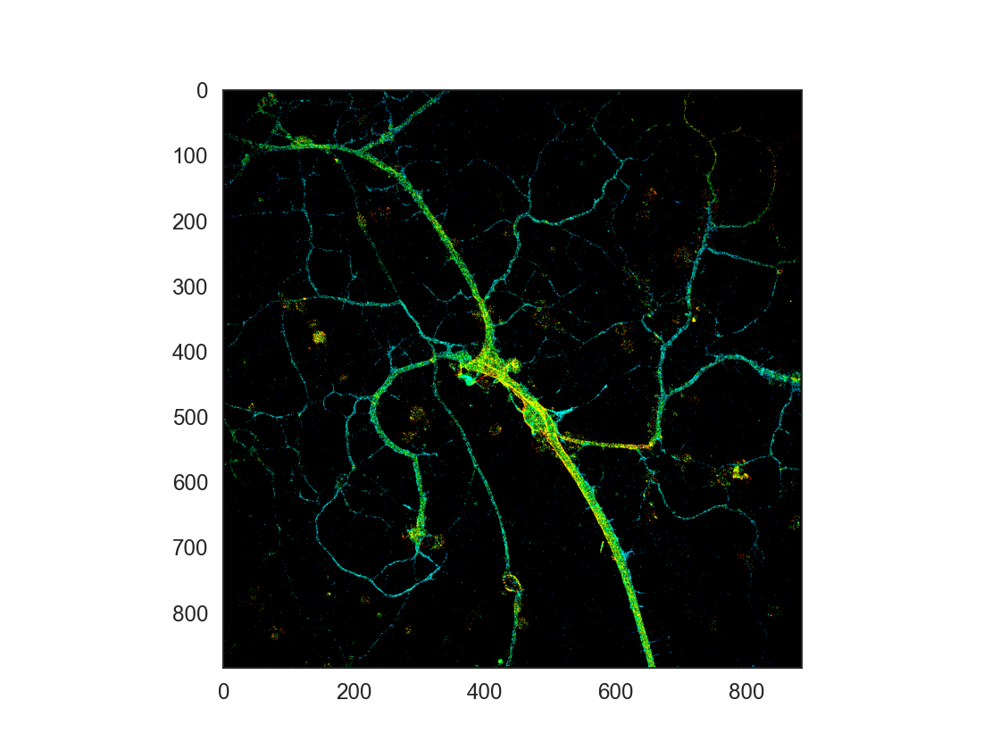

F:\users\FS\FD_DeepLoc_refac\local_utils\plot_funcs.py:98: RuntimeWarning: invalid value encountered in divide
  zavg = zsum / density


In [7]:
# read the prediction list
preds_raw = read_csv(save_path).tolist()

# render, if the FOV is very big, this might be slow and cost large RAM
plt.figure()
hist_img = create_3d_hist(preds_raw, z_clip=[-1500, 1500], pix_size=200, sigma=15, contrast_fac=100)
plt.imshow(hist_img)

<IPython.core.display.Javascript object>


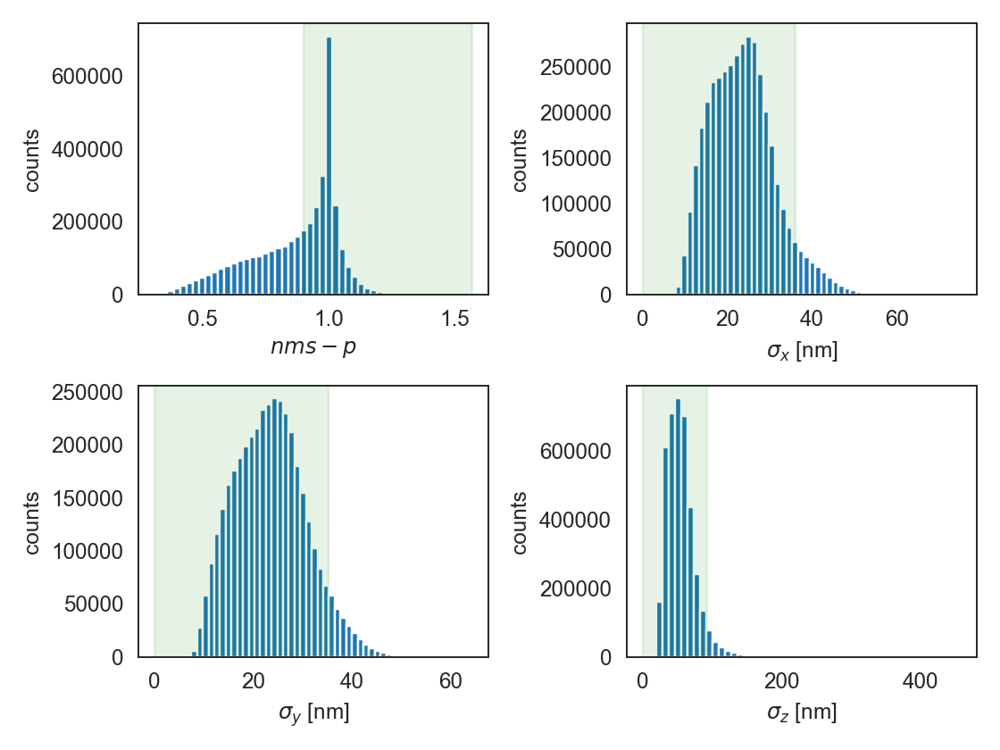

<IPython.core.display.Javascript object>


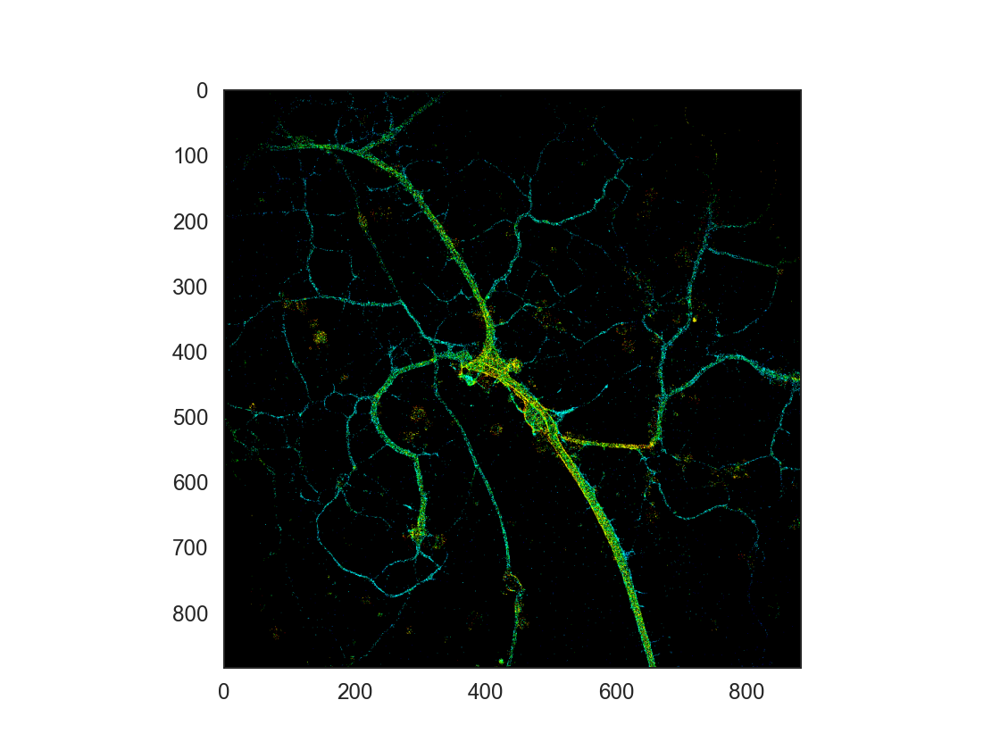

In [8]:
# filter the raw predictions by probability channel and uncertainty channel (can also be done in SMAP)
preds_filtered = filt_preds(preds_raw, nms_p_thre=0.9, sig_perc=95, is_3d=True)
fig, axes = plot_preds_distribution(preds_raw,preds_filtered)

# render, if the FOV is very big, this might be slow and cost large RAM
plt.figure()
hist_img = create_3d_hist(preds_filtered, z_clip=[-1500, 1500], pix_size=200, sigma=15, contrast_fac=100)
plt.imshow(hist_img)

## 6. Load the ground-truth and assess(optional).
If in simulation case, we can compare the network's predictions with the ground truth and calculate performance metrics.

In [ ]:
# if in simulation, read the predictions and ground truth, then evaluate
preds_raw = read_csv(save_path).tolist()
eval_csv = read_csv("F:\projects\FS_work\FD-DeepLoc\data/test_results/fig3_simulated_test(and_clrb)\data_for_fig3(2048fd)/2048fd(2,2)70_grad1/2048fd(2,2)70_grad1_rod_2000f_ph5000bg50_454c/activations.csv")

# compare the raw predictions and the ground truth
match_dict_raw, matches_raw = assess(test_frame_nbr=total_shape[0], test_csv=eval_csv, pred_inp=preds_raw,
                                     size_xy=fov_size, tolerance=250, border=450,
                                     print_res=True, min_int=False, tolerance_ax=500, segmented=False)

In [ ]:
# save the matched predictions and corresponding ground truth
write_csv(matches_raw.tolist(), name='./matched_gt_preds.csv', write_gt=True)